# Random image gen using classic ML (K-Means)

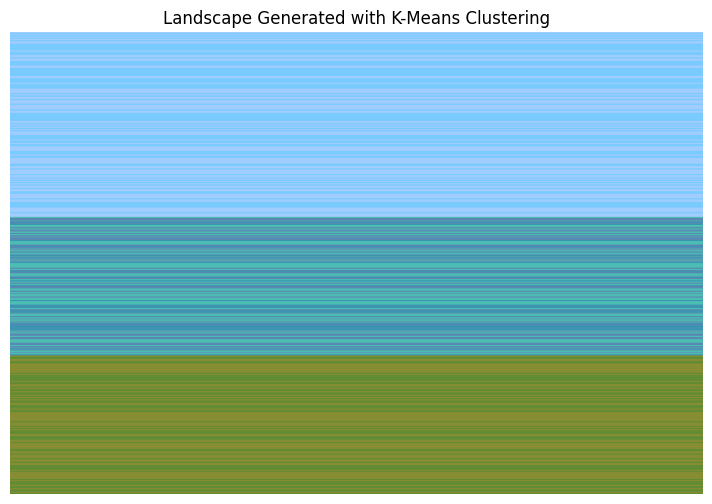

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# Image dimensions
width, height = 600, 400

# Generate base pixel coordinates
x = np.linspace(0, 1, width)
y = np.linspace(0, 1, height)
xx, yy = np.meshgrid(x, y)

# Create structured colour hints for landscape:
# Top = sky (blue), middle = lake (blue-green), bottom = land (green/brown)
pixels = np.zeros((width * height, 3))

for i in range(height):
    if i < height * 0.4:  # Sky region
        pixels[i * width:(i + 1) * width] = [0.4 + np.random.rand() * 0.3, 0.7 + np.random.rand() * 0.2, 1.0]
    elif i < height * 0.7:  # Lake region
        pixels[i * width:(i + 1) * width] = [0.2 + np.random.rand() * 0.2, 0.5 + np.random.rand() * 0.3, 0.7]
    else:  # Land region
        pixels[i * width:(i + 1) * width] = [0.3 + np.random.rand() * 0.3, 0.4 + np.random.rand() * 0.3, 0.2]

# Apply K-Means clustering for colour grouping
n_clusters = 8
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
kmeans.fit(pixels)

# Replace each pixel with its cluster centroid colour
clustered_pixels = kmeans.cluster_centers_[kmeans.labels_]
image = clustered_pixels.reshape(height, width, 3)

# Display the image
plt.figure(figsize=(10, 6))
plt.imshow(image)
plt.axis('off')
plt.title('Landscape Generated with K-Means Clustering')
plt.show()

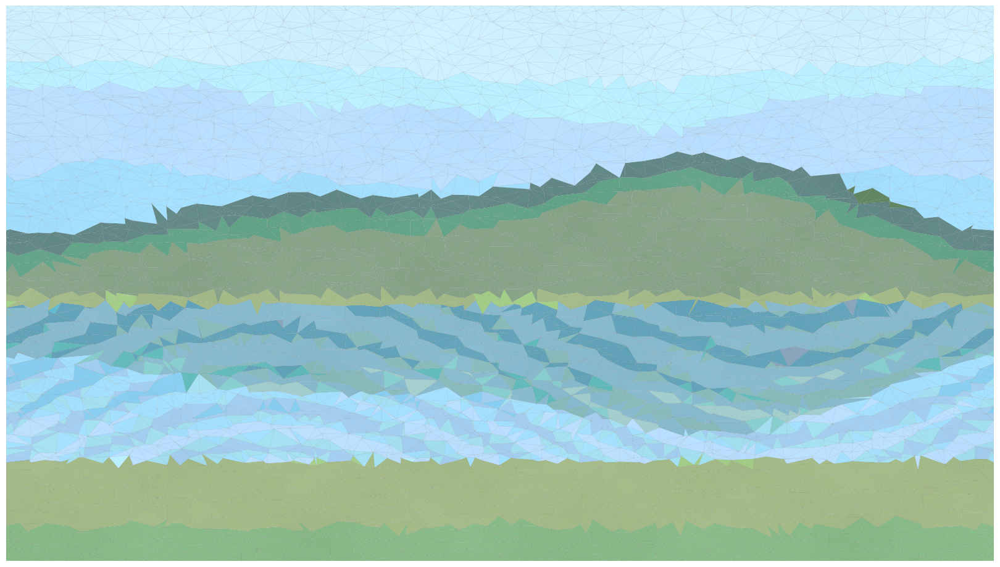

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.collections import PolyCollection
from scipy.spatial import Delaunay
import math
import random

SEED = np.random.randint(0, 100000) #314159   # Fixed seed for exact reproducibility
W, H = 1600, 900
POINT_GRID = (70, 40)  # base grid resolution (more -> finer polygons)
JITTER = 0.012         # polygon irregularity
EXTRA_PTS = 1200       # extra random points
HORIZON = 0.52         # ~top half sky, lower half water/land
LAKE_TOP = HORIZON + 0.02
LAKE_BOTTOM = 0.82     # how deep the lake goes
GAMMA = 2.2            # gamma for pleasant tonemapping

# ------------------------------
# Utilities
# ------------------------------
def set_seed(seed):
    np.random.seed(seed)
    random.seed(seed)

def clamp01(x):
    return max(0.0, min(1.0, x))

def lerp(a, b, t):
    return a * (1 - t) + b * t

def mix(c1, c2, t):
    return tuple(lerp(c1[i], c2[i], t) for i in range(3))

def tone_map(c, gamma=GAMMA):
    # Simple gamma tonemap for nicer output
    return tuple(pow(clamp01(v), 1.0 / gamma) for v in c)

def hex_rgb(h):
    h = h.lstrip("#")
    return tuple(int(h[i:i+2], 16) / 255. for i in (0, 2, 4))

# Smooth pseudo-noise via a sum of sines (deterministic, fast, no external deps)
def smooth_noise(x, y):
    # Frequencies and phases chosen to create organic variation
    return (
        0.52 * math.sin(2.3 * x + 0.7) * math.cos(2.1 * y + 1.9) +
        0.28 * math.sin(5.7 * x - 0.3) * math.cos(3.9 * y + 0.2) +
        0.14 * math.sin(11.0 * x + 1.2) * math.cos(7.3 * y - 0.8)
    ) * 0.5 + 0.5  # map to ~[0,1]

# Mountain ridge (in normalized coords, y from 0 top to 1 bottom)
def ridge_y(x):
    # Layered sines for a natural ridge line
    r = 0.34 + 0.05 * math.sin(6.3 * x + 0.8) + 0.03 * math.sin(12.4 * x + 1.7)
    return clamp01(r)

# Tree line blobs near the ridge (silhouettes)
def tree_mask(x, y):
    r = ridge_y(x)
    # trees appear just below ridge (y a bit larger than r)
    band = clamp01((y - r) / 0.03)  # 0 at ridge, 1 below ~3% height
    n = smooth_noise(8 * x, 40 * y)
    return clamp01((1 - band) * (0.6 + 0.4 * n))

# Water ripple factor
def ripple(x, y):
    # Horizontal ripple bands, subtle
    return 0.5 + 0.5 * math.sin(90.0 * y + 15.0 * math.sin(6.0 * x))

# ------------------------------
# Palette
# ------------------------------
SKY_TOP = hex_rgb("#9ED8FF")     # light blue
SKY_HORIZ = hex_rgb("#58A7E5")   # deeper near horizon

RIDGE_DARK = hex_rgb("#2E4A3A")  # dark pine
RIDGE_LIGHT = hex_rgb("#3E6B50") # lighter green

LAKE_BASE = hex_rgb("#3E8AC9")   # core lake blue
LAKE_SHALLOW = hex_rgb("#62B0D9")

LAND_NEAR = hex_rgb("#4F7C3A")   # near grass
LAND_FAR  = hex_rgb("#6B9352")

SHADOW = hex_rgb("#2B3A4A")

# ------------------------------
# Colour Field (procedural)
# ------------------------------
def base_color(x, y):
    """
    x, y in [0,1], y=0 top.
    Produces a landscape with sky, ridge, trees, lake with reflection, and land.
    """
    # Sky gradient
    if y < HORIZON:
        # Sky up to ridge
        sky_t = clamp01(y / (HORIZON * 0.95))
        c = mix(SKY_TOP, SKY_HORIZ, sky_t)

        # Mountain ridge silhouette cutting into sky
        ry = ridge_y(x)
        if y > ry:
            # below ridge line -> mountain body
            t = clamp01((y - ry) / 0.10)  # darker near ridge, lighter lower
            c = mix(RIDGE_DARK, RIDGE_LIGHT, t)

            # Add tree blobs near ridge
            tm = tree_mask(x, y)
            c = mix(c, RIDGE_DARK, 0.55 * tm)

        # Gentle atmospheric noise in sky
        a = 0.05 * (smooth_noise(3 * x, 3 * y) - 0.5)
        c = tuple(clamp01(ci + a) for ci in c)
        return c

    # Water / land below horizon
    # Lake band
    if LAKE_TOP <= y <= LAKE_BOTTOM:
        # Reflect y across horizon
        y_ref = 2 * HORIZON - y
        y_ref = clamp01(y_ref)

        # Sample what the sky/ridge would have been at reflected y
        # — combine with water tint and ripples
        # Start with reflected sky
        sky_t = clamp01(y_ref / (HORIZON * 0.95)) if HORIZON > 0 else 1.0
        ref_c = mix(SKY_TOP, SKY_HORIZ, sky_t)

        # If reflected position is under ridge, tint darker
        ry = ridge_y(x)
        if y_ref > ry:
            t = clamp01((y_ref - ry) / 0.12)
            ref_c = mix(RIDGE_LIGHT, RIDGE_DARK, 0.5 + 0.5 * t)

        # Water blend
        lake_t = clamp01((y - LAKE_TOP) / (LAKE_BOTTOM - LAKE_TOP + 1e-6))
        water_c = mix(LAKE_BASE, LAKE_SHALLOW, 0.25 + 0.75 * lake_t)

        # Ripples modulate brightness
        r = ripple(x, y) * 0.12
        c = mix(ref_c, water_c, 0.58)  # base reflectivity blend
        c = tuple(clamp01(ci + (r - 0.06)) for ci in c)

        # Slight lateral colour drift for variation
        drift = 0.04 * (smooth_noise(5 * x, 1.5 * y) - 0.5)
        c = (clamp01(c[0] + drift), clamp01(c[1] + 0.5 * drift), clamp01(c[2]))

        return c

    # Land below lake (shore/grass)
    t = clamp01((y - LAKE_BOTTOM) / (1.0 - LAKE_BOTTOM + 1e-6))
    c = mix(LAND_FAR, LAND_NEAR, t)

    # Add shadow streaks to land for texture
    s = smooth_noise(6 * x, 6 * y)
    c = mix(c, SHADOW, 0.10 * (s - 0.5) + 0.08)

    return c

# ------------------------------
# Point Set and Triangulation
# ------------------------------
def generate_points():
    gx, gy = POINT_GRID
    xs = np.linspace(0, 1, gx)
    ys = np.linspace(0, 1, gy)
    pts = []
    for yy in ys:
        for xx in xs:
            jx = (np.random.rand() - 0.5) * 2 * JITTER
            jy = (np.random.rand() - 0.5) * 2 * JITTER
            pts.append([clamp01(xx + jx), clamp01(yy + jy)])

    # Extra random points, denser near horizon & lake for detail
    for _ in range(EXTRA_PTS):
        xx = np.random.rand()
        # Bias y distribution toward lake region
        r = np.random.rand()
        if r < 0.55:
            yy = np.random.uniform(LAKE_TOP - 0.06, LAKE_BOTTOM + 0.06)
        elif r < 0.75:
            yy = np.random.uniform(0.0, HORIZON + 0.05)
        else:
            yy = np.random.uniform(LAKE_BOTTOM - 0.02, 1.0)

        yy = clamp01(yy)
        pts.append([xx, yy])

    # Add a dense border to ensure clean edges
    border = 80
    for i in range(border):
        t = i / (border - 1)
        pts.append([t, 0.0])
        pts.append([t, 1.0])
        pts.append([0.0, t])
        pts.append([1.0, t])

    return np.array(pts)

def triangulate(pts):
    # Delaunay triangulation in normalized coords
    return Delaunay(pts)

# ------------------------------
# Render
# ------------------------------

set_seed(SEED)
pts = generate_points()
tri = triangulate(pts)

# Build triangle polygons in pixel coordinates and colour each by centroid
polys = []
colors = []

for simplex in tri.simplices:
    tri_pts = pts[simplex]
    cx, cy = tri_pts.mean(axis=0)
    # Color at centroid
    c = base_color(cx, cy)

    # Mild polygon-wise colour quantization for stronger stained-glass look
    q = 9  # quantization levels
    c = tuple(np.floor(np.array(c) * q) / max(1, (q - 1)))
    c = tone_map(c)

    # Add slight centroid-based noise for organic variation
    n = 0.03 * (smooth_noise(10 * cx, 10 * cy) - 0.5)
    c = tuple(clamp01(ci + n) for ci in c)

    # Convert polygon to pixel space
    px = (tri_pts[:, 0] * W).tolist()
    py = (tri_pts[:, 1] * H).tolist()
    # Matplotlib origin is top-left if we invert y-axis later; keep as-is
    polys.append(list(zip(px, py)))
    colors.append(c)

fig = plt.figure(figsize=(W / 100, H / 100), dpi=100)
ax = plt.axes([0, 0, 1, 1])
ax.set_xlim(0, W)
ax.set_ylim(H, 0)  # invert y so y=0 is top
ax.axis("off")

coll = PolyCollection(polys, facecolors=colors, edgecolors=(0, 0, 0, 0.08), linewidths=0.4, antialiased=True)
ax.add_collection(coll)

# Optional: subtle vignette overlay
vignette = plt.Circle((W / 2, H / 2), radius=max(W, H) * 0.65, color=(0, 0, 0), fill=False, lw=0)
vignette.set_alpha(0.0)  # disabled by default

fig.savefig("images/lakeML.png", bbox_inches='tight', pad_inches=0)

plt.show()


# Gen AI

b'{"created":1788887152,"data":[{"b64_json":"/9j/4AAQSkZJRgABAQAAAQABAAD/60oASlACEQAAAAEAAEn2anVtYgAAAB5qdW1kYzJwYQARABCAAACqADibcQNjMnBhAAAASdBqdW1iAAAAR2p1bWRjMm1hABEAEIAAAKoAOJtxA3VybjpjMnBhOjk4ZDcwZTBkLTYzOWMtNDNhMC1hYjYwLWVkYmY0NWZjZGFiYwAAAAQEanVtYgAAAClqdW1kYzJhcwARABCAAACqADibcQNjMnBhLmFzc2VydGlvbnMAAAAB+Wp1bWIAAABBanVtZGNib3IAEQAQgAAAqgA4m3ETYzJwYS5hY3Rpb25zLnYyAAAAABhjMnNokZXepR/nT7bgTMARkh6cDwAAAbBjYm9yomdhY3Rpb25zgqVmYWN0aW9ubGMycGEuY3JlYXRlZGR3aGVueBkyMDI2LTA5LTA4VDE3OjA1OjUzKzAwOjAwbXNvZnR3YXJlQWdlbnS/ZG5hbWV4HUJsYWNrIEZvcmVzdCBMYWJzIGluIEF6dXJlIEFJ/3FkaWdpdGFsU291cmNlVHlwZXhGaHR0cDovL2N2LmlwdGMub3JnL25ld3Njb2Rlcy9kaWdpdGFsc291cmNldHlwZS90cmFpbmVkQWxnb3JpdGhtaWNNZWRpYWtkZXNjcmlwdGlvbnFHZW5lcmF0ZWQgd2l0aCBBSaRmYWN0aW9ucGMycGEud2F0ZXJtYXJrZWRkd2hlbnghMjAyNi0wOS0wOFQxNzowNTo1My45MTY1NDM2KzAwOjAwbXNvZnR3YXJlQWdlbnS/ZG5hbWVpTWljcm9zb2Z0Z3ZlcnNpb25jMS4w/2tkZXNjcmlwdGlvbngvQ29udGVudCB3YXRlcm1hcmtlZCBieSBNaWNyb3NvZnQgUmVzcG9uc2libGUgQUlyYWxsQWN0aW9uc0luY2x1ZGVk9QAAARdqdW1iAAAAQ2p

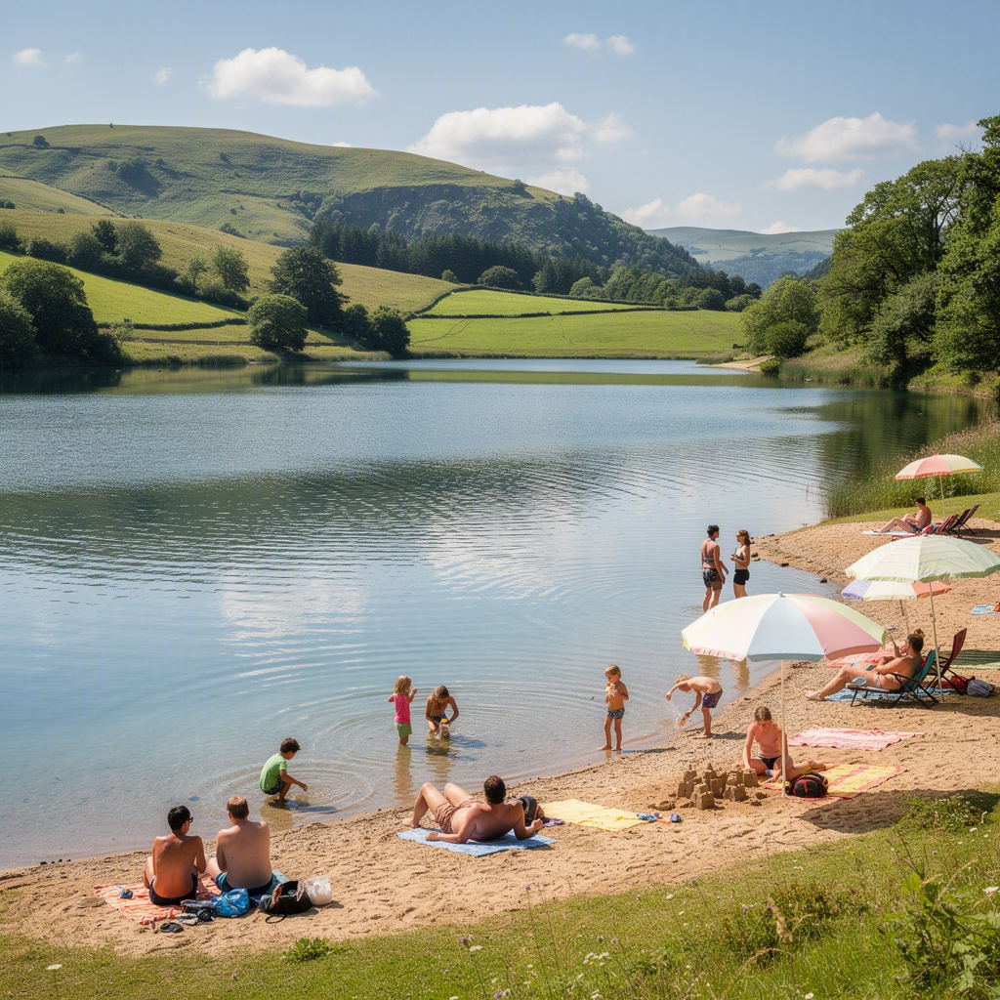

In [10]:
import requests
import base64
import configparser; config = configparser.RawConfigParser()

# Replace with your actual endpoint and API key
endpoint = "https://AIFSweden.services.ai.azure.com/providers/blackforestlabs/v1/flux-2-pro?api-version=preview"

from azure.identity import DefaultAzureCredential
credential = DefaultAzureCredential()
token = credential.get_token("https://cognitiveservices.azure.com/.default")

headers = {
    "Content-Type": "application/json",
    "Authorization": f"Bearer {token.token}"
}

payload = {
    "prompt": "A realistic photograph of a beautiful lake with green hills in the background. There is a small beach with people sunbathing and playing. It looks like a beautiful location of outstanding natural beauty.",
    "size": "1024x1024",
    "n": 1,
    "model": "FLUX.2-pro"
}

response = requests.post(endpoint, headers=headers, json=payload)
print(response.content)
response.raise_for_status()

# Extract base64 image and save as PNG
image_base64 = response.json()["data"][0]["b64_json"]
image_bytes = base64.b64decode(image_base64)

with open("Images/LAKE.png", "wb") as f:
    f.write(image_bytes)

print("Image saved")

from IPython.display import Image
Image("Images/LAKE.png")



## Gen AI to create a realistic version of the ML (without telling it what it is)

Sending request to FLUX.2-pro...
Status code: 200

Request completed successfully.
Image saved to: images/lake2.png


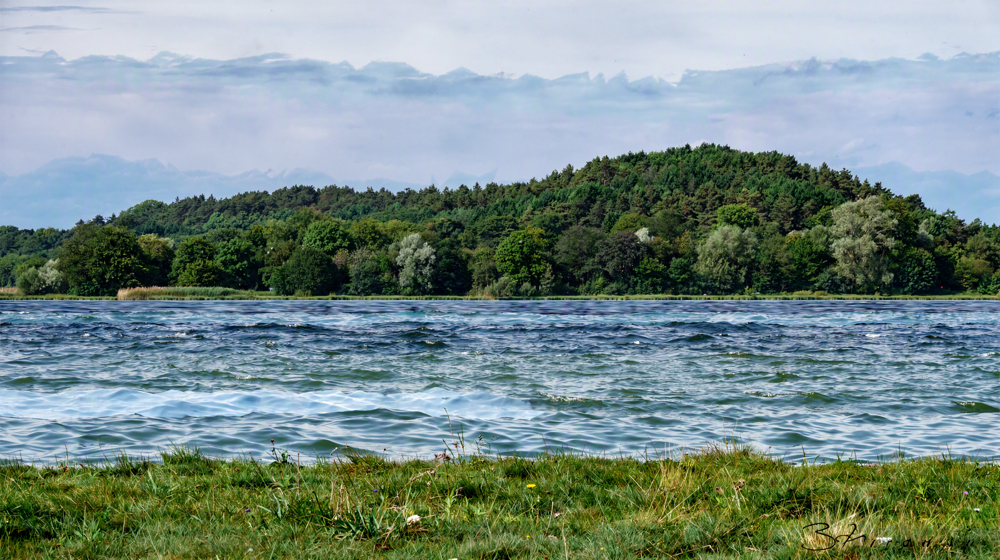

In [16]:
import base64
import requests
from pathlib import Path
from azure.identity import DefaultAzureCredential
from IPython.display import Image, display


# ============================================================
# 1. Configuration
# ============================================================

endpoint = (
    "https://AIFSweden.services.ai.azure.com"
    "/providers/blackforestlabs/v1/flux-2-pro"
    "?api-version=preview"
)

input_image_path = "images/lakeML.png"
output_image_path = "images/lake2.png"

prompt = "Take this image and make it look realistic."


# ============================================================
# 2. Authenticate using Microsoft Entra ID
# ============================================================

credential = DefaultAzureCredential()

token = credential.get_token(
    "https://cognitiveservices.azure.com/.default"
)

headers = {
    "Authorization": f"Bearer {token.token}",
    "Content-Type": "application/json"
}


# ============================================================
# 3. Convert input image to Base64
# ============================================================

def encode_image(path):
    with open(path, "rb") as image_file:
        return base64.b64encode(
            image_file.read()
        ).decode("utf-8")


image_base64 = encode_image(input_image_path)


# ============================================================
# 4. Build FLUX.2 Pro request
# ============================================================

payload = {
    "model": "FLUX.2-pro",
    "prompt": prompt,
    "output_format": "png",
    "input_image": image_base64
}


# ============================================================
# 5. Send request
# ============================================================

print("Sending request to FLUX.2-pro...")

response = requests.post(
    endpoint,
    headers=headers,
    json=payload,
    timeout=300
)

print("Status code:", response.status_code)


# ============================================================
# 6. Check for errors
# ============================================================

if not response.ok:
    print("\nRequest failed.")
    print("Response:")
    print(response.text)
    response.raise_for_status()


# ============================================================
# 7. Read response
# ============================================================

result = response.json()

print("\nRequest completed successfully.")


# ============================================================
# 8. Extract generated image
# ============================================================

if (
    "data" in result
    and len(result["data"]) > 0
    and "b64_json" in result["data"][0]
):

    image_base64 = result["data"][0]["b64_json"]

    image_bytes = base64.b64decode(image_base64)

    Path(output_image_path).parent.mkdir(
        parents=True,
        exist_ok=True
    )

    with open(output_image_path, "wb") as f:
        f.write(image_bytes)

    print(f"Image saved to: {output_image_path}")

    display(Image(filename=output_image_path))


# ============================================================
# 9. Fallback: show response if format is unexpected
# ============================================================

else:
    print("Unexpected response format:")
    print(result)

# Open CV spot the diff

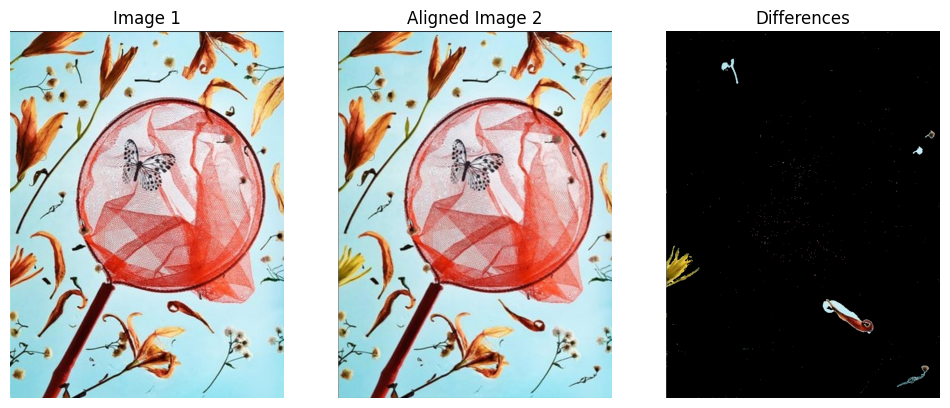

In [17]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load images
img1 = cv2.imread("images/BF1.JPG")
img2 = cv2.imread("images/BF2.JPG")

# Convert to grayscale for feature detection
gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

# Use ORB feature detector
orb = cv2.ORB_create(5000)
kp1, des1 = orb.detectAndCompute(gray1, None)
kp2, des2 = orb.detectAndCompute(gray2, None)

# Match features using BFMatcher
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
matches = bf.match(des1, des2)
matches = sorted(matches, key=lambda x: x.distance)

# Extract matched keypoints
pts1 = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
pts2 = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)

# Compute homography
H, _ = cv2.findHomography(pts2, pts1, cv2.RANSAC)

# Warp img2 to align with img1
aligned_img2 = cv2.warpPerspective(img2, H, (img1.shape[1], img1.shape[0]))

# Compute difference
diff = cv2.absdiff(img1, aligned_img2)
mask = cv2.cvtColor(diff, cv2.COLOR_BGR2GRAY)

# Threshold to highlight differences
_, imask = cv2.threshold(mask, 30, 255, cv2.THRESH_BINARY)

# Apply mask
canvas = np.zeros_like(img1)
canvas[imask > 0] = aligned_img2[imask > 0]

# Display results
plt.figure(figsize=(12, 6))
plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
plt.title('Image 1')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(cv2.cvtColor(aligned_img2, cv2.COLOR_BGR2RGB))
plt.title('Aligned Image 2')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(cv2.cvtColor(canvas, cv2.COLOR_BGR2RGB))
plt.title('Differences')
plt.axis('off')

plt.show()

### GPT no tools

I can’t directly edit and return files from this chat, but I can (1) show you how to automatically find and mark every visual difference between the two panels, (2) give code that draws red circles around each difference and saves a single annotated JPG, and (3) print the list of detected differences (coordinates + size) so you can review them.

Copy & run the code below in a Jupyter notebook (or any Python environment). It handles the typical case where you uploaded a single side-by-side image (like the one you provided). If instead you have two separate image files, the code includes a small branch for that too.

Requirements
- Python 3.x
- OpenCV (cv2), NumPy, matplotlib (optional for inline display)

Install with:
pip install opencv-python-headless numpy matplotlib

Code (paste into a Jupyter cell and run)
```python
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# ---------- USER PARAMETERS ----------
# If you have a single side-by-side image, set combined

(-0.5, 699.5, 466.5, -0.5)

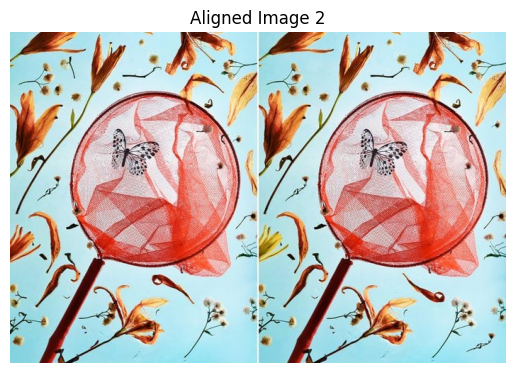

In [18]:
from openai import AzureOpenAI
import os
import base64
from azure.identity import DefaultAzureCredential, get_bearer_token_provider

token_provider = get_bearer_token_provider(
    DefaultAzureCredential(), "https://cognitiveservices.azure.com/.default"
)


# Read image file as bytes
with open("images/BFBoth.JPG", "rb") as f:
    image_bytes = f.read()

# Encode image bytes to base64
def encode_image_from_bytes(image_bytes):
    return base64.b64encode(image_bytes).decode("utf-8")

base64_image = encode_image_from_bytes(image_bytes)

client = AzureOpenAI(
  azure_endpoint = "https://aifsweden.openai.azure.com/", 
  azure_ad_token_provider=token_provider,
  api_version="2025-03-01-preview"
)

def encode_image(image_path):
    with open(image_path, "rb") as image_file:
        return base64.b64encode(image_file.read()).decode("utf-8")

response = client.responses.create(
    model="gpt-5-mini",
    input=[
        {"role": "user", "content": "List all the differences between these two images. Mark/circle the differences directly on the image in red and return the annotated copy as a JPG. Mark every difference I can find and return a single annotated JPG, not multiple images. Give me the python code so I can run in a jupyter notebook"},
        {
            "role": "user",
            "content": [
                {
                    "type": "input_image",
                    "image_url": f"data:image/png;base64,{base64_image}"
                }
            ]
        }
    ]
)

print(response.output_text)

import numpy as np

# Decode image_bytes to numpy array
image_np = cv2.imdecode(np.frombuffer(image_bytes, np.uint8), cv2.IMREAD_COLOR)

plt.imshow(cv2.cvtColor(image_np, cv2.COLOR_BGR2RGB))
plt.title('Aligned Image 2')
plt.axis('off')

Saved annotated image to: images/annotated.jpg
Detected 6 difference regions (area threshold 50).


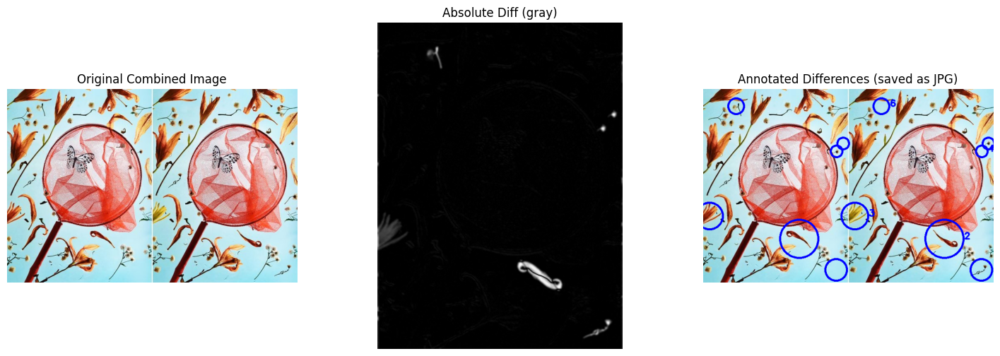

In [19]:
# Requires: pip install opencv-python-headless numpy matplotlib
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Path to your input image (the side-by-side image you uploaded)
INPUT_PATH = "images/BFBoth.JPG"      # put your side-by-side image here
OUTPUT_FILENAME = "images/annotated.jpg" # annotated output

# Parameters - tweak if needed
area_threshold = 50          # minimum contour area to be considered a real difference
blur_ksize = (5,5)           # blur before difference (reduce noise)
thresh_val = 30              # threshold on difference image
morph_kernel_size = 5        # morphological opening/closing kernel size
dilate_iterations = 2        # dilation to join difference blobs
circle_color = (255, 0, 0)   # red in BGR
circle_thickness = 3

# Read image
img = cv2.imread(INPUT_PATH)
if img is None:
    raise FileNotFoundError(f"Could not read {INPUT_PATH}. Put your image in the working folder or change the path.")

h, w = img.shape[:2]

# If the input image is exactly two panels side-by-side, split in half
left = img[:, :w//2].copy()
right = img[:, w//2:].copy()

# Ensure same size
if left.shape != right.shape:
    # resize right to left size if necessary
    right = cv2.resize(right, (left.shape[1], left.shape[0]))

# Work in RGB for display but compute diff in grayscale
left_gray = cv2.cvtColor(left, cv2.COLOR_BGR2GRAY)
right_gray = cv2.cvtColor(right, cv2.COLOR_BGR2GRAY)

# Optional blur to reduce sensor noise weirdness
left_gray = cv2.GaussianBlur(left_gray, blur_ksize, 0)
right_gray = cv2.GaussianBlur(right_gray, blur_ksize, 0)

# Absolute difference
diff = cv2.absdiff(left_gray, right_gray)

# Threshold the difference to create a mask
_, thresh = cv2.threshold(diff, thresh_val, 255, cv2.THRESH_BINARY)

# Morphological operations to clean up noise
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (morph_kernel_size, morph_kernel_size))
clean = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=1)
clean = cv2.dilate(clean, kernel, iterations=dilate_iterations)
clean = cv2.morphologyEx(clean, cv2.MORPH_CLOSE, kernel, iterations=1)

# Find contours of differing regions
contours, _ = cv2.findContours(clean, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Prepare annotated copy: draw circles on a combined image (showing both panels)
# We'll draw on the right-side panel of the combined image to indicate where differences are located
annotated = img.copy()  # draw on top of the original combined image

# Accumulate drawn circles for display/log
drawn = []

for cnt in contours:
    area = cv2.contourArea(cnt)
    if area < area_threshold:
        continue
    # get bounding circle center and radius relative to left/right image
    (x, y), radius = cv2.minEnclosingCircle(cnt)
    x = int(x); y = int(y); radius = int(radius)
    # The contours are coordinates in the split-half coordinate system (left half).
    # We found the contours from the diff of left vs right images — the diff mask corresponds to that coordinate frame (left/right half).
    # We'll draw the circle twice: one on left panel (offset 0) and one on right panel (offset +w//2)
    # But as requested: return a single annotated JPG marking differences. We'll mark both panels so differences are obvious.
    offset = 0
    cv2.circle(annotated, (offset + x, y), radius+6, circle_color, circle_thickness)
    offset_right = w//2
    cv2.circle(annotated, (offset_right + x, y), radius+6, circle_color, circle_thickness)
    drawn.append(((x,y), radius))

# If you prefer marking only on the right panel, comment out the left draw above.
# Optionally label each circle with an index
font = cv2.FONT_HERSHEY_SIMPLEX
for i, ((x,y), radius) in enumerate(drawn, start=1):
    # draw number near right-panel circle
    cv2.putText(annotated, str(i), (w//2 + x + radius + 8, y), font, 0.7, circle_color, 2, cv2.LINE_AA)

# Save annotated image
cv2.imwrite(OUTPUT_FILENAME, annotated)
print(f"Saved annotated image to: {OUTPUT_FILENAME}")
print(f"Detected {len(drawn)} difference regions (area threshold {area_threshold}).")

# Display the original, diff mask and annotated image inline (for Jupyter)
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
axs[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
axs[0].set_title("Original Combined Image")
axs[0].axis('off')
axs[1].imshow(diff, cmap='gray')
axs[1].set_title("Absolute Diff (gray)")
axs[1].axis('off')
axs[2].imshow(cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB))
axs[2].set_title("Annotated Differences (saved as JPG)")
axs[2].axis('off')
plt.show()

# Dolphin detection

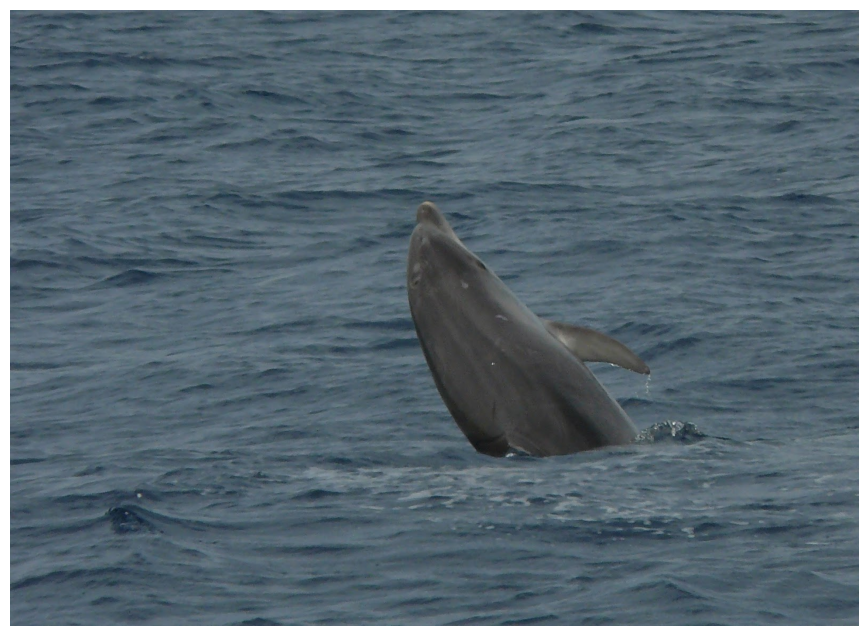

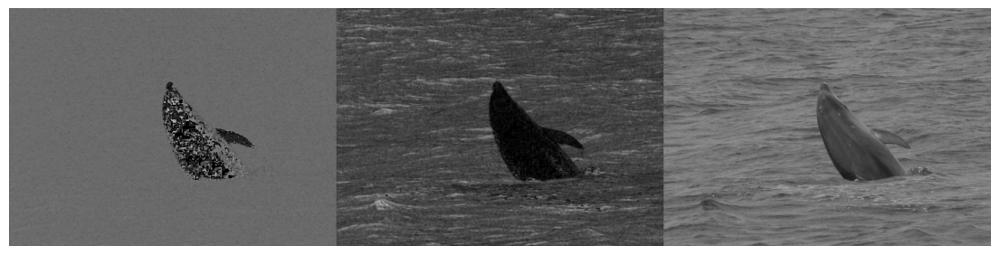

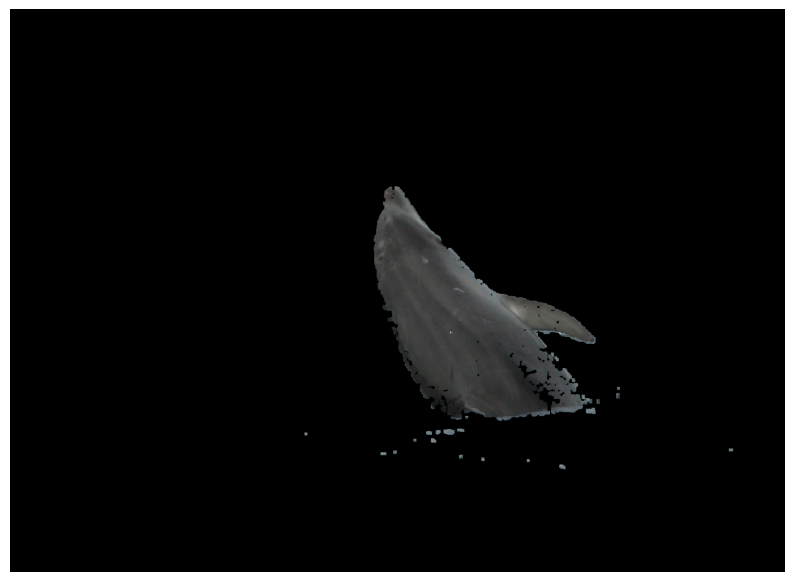

In [16]:
# pip install opencv-python==3.4.3.18
from __future__ import print_function
import cv2
import numpy as np
import matplotlib.pyplot as plt

frame = cv2.imread("images\dolphin.jpg")

frame_gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
hsv = cv2.cvtColor(frame, cv2.COLOR_BGR2HSV)
plt.figure(figsize=(12, 8))
plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

h = hsv[:, :, 0]  # hue
s = hsv[:, :, 1]  # saturation
v = hsv[:, :, 2]  # intensity

# Thresholds
_, min_sat = cv2.threshold(s, 35, 255, cv2.THRESH_BINARY)  # Anything value 35 or higher will be white
_, max_hue = cv2.threshold(h, 20, 255, cv2.THRESH_BINARY_INV)
hsv_split = np.concatenate((h,s,v), axis = 1)

fig2 = plt.figure(figsize = (14,14)) 
ax3 = fig2.add_subplot(111)
ax3.imshow(hsv_split, cmap="gray")
ax3.axis("off")
plt.show()

ret, min_sat = cv2.threshold(s,35,255, cv2.THRESH_BINARY) 

#Put the colour back in
min_sat = cv2.bitwise_not(min_sat)
min_sat_col = cv2.bitwise_and(frame, frame, mask = min_sat)

#Get rid of any pixels that are on their own
kernel = np.ones((2,2), np.uint8)
min_sat = cv2.morphologyEx(min_sat, cv2.MORPH_OPEN,
                            kernel, iterations=5)
min_sat_col = cv2.bitwise_and(frame, frame, mask = min_sat)
fig2 = plt.figure(figsize = (10,10))
ax3 = fig2.add_subplot(111)
ax3.imshow(cv2.cvtColor(min_sat_col, cv2.COLOR_BGR2RGB))
ax3.axis("off")
plt.show()



b'{"created":1780305484,"data":[{"url":null,"b64_json":"iVBORw0KGgoAAAANSUhEUgAABAAAAAQACAIAAADwf7zUAABKOWNhQlgAAEo5anVtYgAAAB5qdW1kYzJwYQARABCAAACqADibcQNjMnBhAAAAShNqdW1iAAAAR2p1bWRjMm1hABEAEIAAAKoAOJtxA3VybjpjMnBhOjBmMTU3Yjc5LTE5MWQtNDk3My05ZGNlLTQyZmIzN2FiNjllOAAAAAQsanVtYgAAAClqdW1kYzJhcwARABCAAACqADibcQNjMnBhLmFzc2VydGlvbnMAAAACIWp1bWIAAABBanVtZGNib3IAEQAQgAAAqgA4m3ETYzJwYS5hY3Rpb25zLnYyAAAAABhjMnNoDgylcOp97aAX4usLQsauGAAAAdhjYm9yomdhY3Rpb25zgqVmYWN0aW9ubGMycGEuY3JlYXRlZGR3aGVueBkyMDI2LTA2LTAxVDA5OjE4OjA0KzAwOjAwbXNvZnR3YXJlQWdlbnS/ZG5hbWV4HUJsYWNrIEZvcmVzdCBMYWJzIGluIEF6dXJlIEFJ/3FkaWdpdGFsU291cmNlVHlwZXhTaHR0cDovL2N2LmlwdGMub3JnL25ld3Njb2Rlcy9kaWdpdGFsc291cmNldHlwZS9jb21wb3NpdGVXaXRoVHJhaW5lZEFsZ29yaXRobWljTWVkaWFrZGVzY3JpcHRpb25xR2VuZXJhdGVkIHdpdGggQUmkZmFjdGlvbnBjMnBhLndhdGVybWFya2VkZHdoZW54ITIwMjYtMDYtMDFUMDk6MTg6MDYuNjA4NjgwMiswMDowMG1zb2Z0d2FyZUFnZW50v2RuYW1leCNNaWNyb3NvZnQgUmVzcG9uc2libGUgQUkgUHJvdmVuYW5jZWd2ZXJzaW9uYzEuMP9rZGVzY3JpcHRpb254L0NvbnRlbnQgd2F0ZXJtYXJrZWQgYnkg

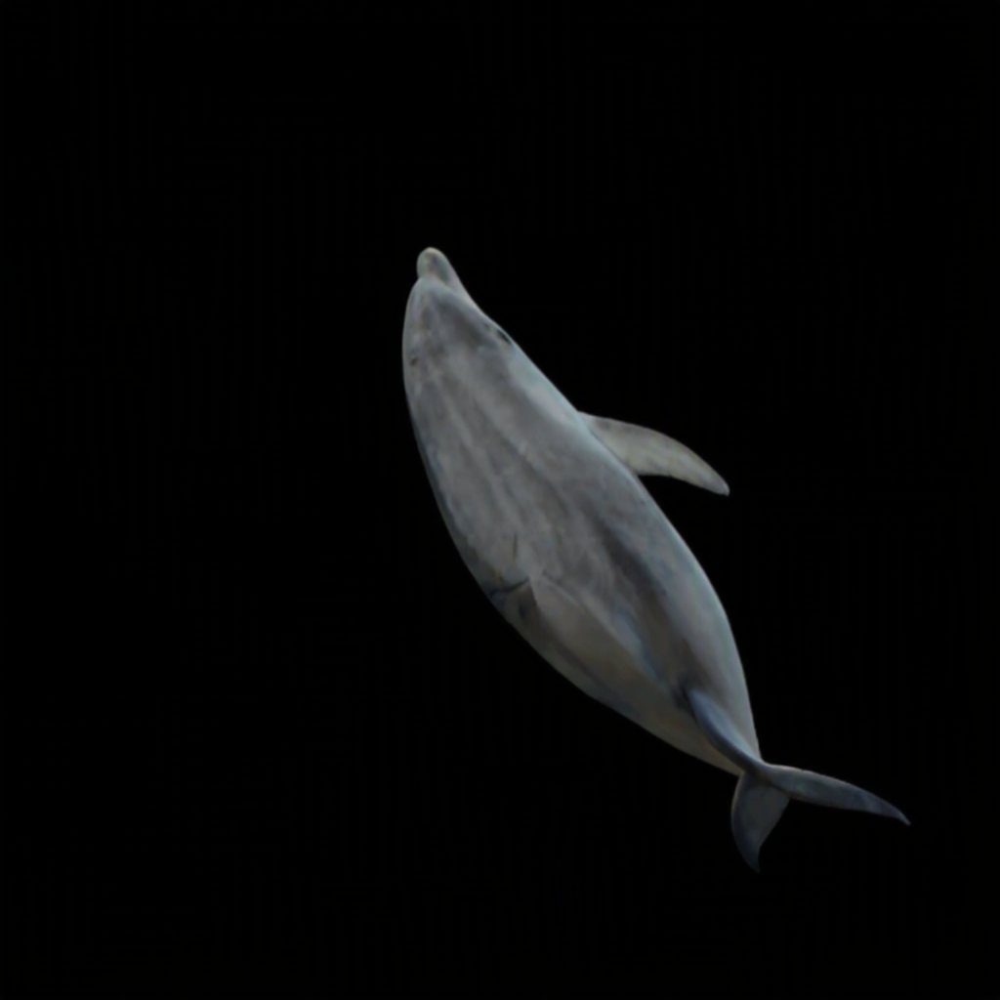

In [4]:
import requests
import base64
import configparser; config = configparser.RawConfigParser()
from azure.identity import DefaultAzureCredential, get_bearer_token_provider

credential = DefaultAzureCredential()
token = credential.get_token("https://cognitiveservices.azure.com/.default")

endpoint = "https://aifsweden.services.ai.azure.com/openai/deployments/FLUX.1-Kontext-pro/images/edits?api-version=2025-04-01-preview"

headers = {
    "Authorization": f"Bearer {token.token}"
}

files = {
    "model": (None, "FLUX.2-pro"),
    "image": ("imgea_to_edit.png", open("images\dolphin.jpg", "rb")),
    "prompt": (None, "Create a version of this image that keeps the dolphin and blanks out the sea. Keep the same position of the dolphin and they should just be floating in a black void. Do not add anything apart from the visible parts. Don't show the tail if it was underwater"),}

response = requests.post(endpoint, headers=headers, files=files)
print(response.content)
response.raise_for_status()

image_base64 = response.json()["data"][0]["b64_json"]
image_bytes = base64.b64decode(image_base64)

with open("images/GOTSkin.png", "wb") as f:
    f.write(image_bytes)

print("Image saved")

from IPython.display import Image
Image("images/GOTSkin.png")
